In [1]:
import xarray as xr
import dask
import numpy as np
from datetime import datetime, timedelta
from cartopy.feature.nightshade import Nightshade
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import os, glob, sys, gc
from tqdm.auto import tqdm
import pandas as pd

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import argparse
import glob
import os
from datetime import timedelta

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable

import numpy as np
import xarray as xr

import importlib

import warnings

In [3]:
import utility_programs.filters as filters
from utility_programs.plotting_routines import panel_plot
from utility_programs.read_routines.GITM import auto_read as auto_read_gitm
from utility_programs.read_routines.GITM import gitm_times_from_filelist
from utility_programs.read_routines.SAMI import auto_read as auto_read_sami
from utility_programs import plotting_routines
from utility_programs.utils import ut_to_lt
from utility_programs.utils import add_lt_to_dataset

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [4]:
data = '/glade/u/home/abukowski/scratch/postprocessed/'

In [5]:
gitms = {}
samis = {}

for full_path in np.sort(glob.glob(os.path.join(data,'*.nc'))):

    fname = full_path[full_path.rfind('/')+1:]
    datas = fname[:-3].split('_')
    month = datas[0]

    if 'bz' in datas[1]:
        if 'SAMI' in datas:
            model = datas[-2] + '-'+datas[-1]
        else:
            model = datas[-1]
        month = datas[0]
        runname = datas[1][5:]
        onset = datas[2]
        duration = datas[3]

    elif 'thm' not in datas:
        if 'SAMI' in datas:
            model = datas[-2] + '-'+datas[-1]
        else:
            model = datas[-1]
        month = datas[0]
        runname = datas[1]
        onset = datas[2]
        duration = datas[3]
        
    else:
        continue

    if model == 'GITM':
        gitms['-'.join([month, onset, duration, runname])] = xr.open_mfdataset(full_path, engine='h5netcdf')

    elif model == 'SAMI-REGRID':
        samis['-'.join([month, onset, duration, runname])] = xr.open_mfdataset(full_path, engine='h5netcdf')


In [6]:
# Preprocess


## Time slicing
t_starts = {'ut6':'03:00:00', 'ut12':'09:00:00', 'ut18':'15:00:00'}

for k in gitms.keys():
    key = k.split('-')[1]
    t_start = gitms[k].time.values[0] + pd.Timedelta('1 day' + t_starts[key])
    t_end = t_start + pd.Timedelta('10 hours')
    
    gitms[k] = gitms[k].sel(time = slice(t_start, t_end))
    
for k in samis.keys():
    key = k.split('-')[1]
    t_start = samis[k].time.values[0] + pd.Timedelta('1 day' + t_starts[key])
    t_end = t_start + pd.Timedelta('8 hours')
    samis[k] = samis[k].sel(time = slice(t_start, t_end))    


In [7]:
def format_colname_for_title(runname, unpack_bz=False):
    
    names = runname.split('-')
    outname = ' '.join([i[0].upper()+i[1:] for i in runname.split('-')])
    
    if 'Bz' in outname:
        outname = '$\mathrm{'+outname.replace('Bz', 'B_z=-') + '}$'
        if 'By' in outname:
            outname = outname.replace(' By', ', B_y=')
            
        outname = outname.replace(' ', '\ ')
            
    # outname = outname.replace('Storm ', 'Storm-')
    
    outname = outname.replace('neg', 'Negative')
    outname = outname.replace('pos', 'Positive')
    outname = outname.replace('Ut', 'UT')
    
    if unpack_bz:
        outname = '$\mathrm{'+outname[outname.find('B'):]
        neg=False
        if 'N' in outname:
            neg=True
        fifteen=False
        if '15' in outname:
            fifteen=True

        if neg:
            if fifteen:
                outname = outname.replace('Negative','-8')
            else:
                outname = outname.replace('Negative','-15')
        else:
            if fifteen:
                outname = outname.replace('Positive','+8')
            else:
                outname = outname.replace('Positive','-15')
    
    return outname

# Bz Comparisons:

In [8]:
bzkeys = np.sort([k for k in gitms.keys() if 'bz' in k])

In [9]:
bzkeys

array(['nov-ut12-storm-on-bz15-byneg', 'nov-ut12-storm-on-bz15-bypos',
       'nov-ut12-storm-on-bz17', 'nov-ut12-storm-on-bz8-byneg',
       'nov-ut12-storm-on-bz8-bypos'], dtype='<U28')

In [10]:
# Before the storm all will be the same:
## Only need one plot of this:

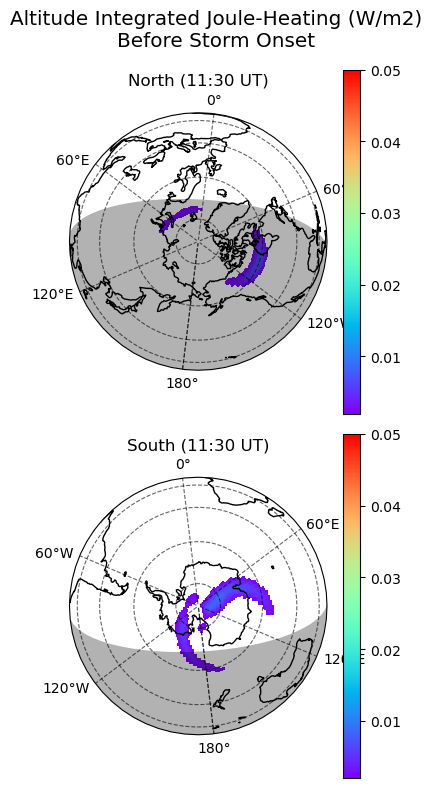

In [12]:
fig = plotting_routines.loop_panels(
    gitms[bzkeys[0]].AltIntJouleHeating_W_m2,
    ncols=1,
    lon_labels=True,
    mask_dials=0.002,
    vmax=0.05,
    cmap='rainbow',
    start_time=pd.Timestamp('2011-11-21 11:30'))

fig.suptitle('Altitude Integrated Joule-Heating (W/m2)\nBefore Storm Onset', fontsize='x-large')
fig.tight_layout()
# fig.show()
fig.savefig('good-plots/jh-rotb/before', bbox_inches='tight')

In [155]:
for col in bzkeys:
    print(format_colname_for_title(col, unpack_bz=True))

$\mathrm{B_z=-15,\ B_y=-8}$
$\mathrm{B_z=-15,\ B_y=-8}$
$\mathrm{B_z=-17}$
$\mathrm{B_z=-8,\ B_y=-15}$
$\mathrm{B_z=-8,\ B_y=+15}$


In [186]:
def row_of_2_dials(da, time_here, mask=None, **plotargs):
    
    
    if len(da.time.values)> 1:
        da=da.sel(time=time_here, method='nearest')
        
    if mask is not None:
        da = da.where(np.abs(da > mask))
    
    
    fig = plt.figure(figsize=[9, 4])

    axs = []

    lons = np.arange(0, 360)
    lts = ut_to_lt([time_here], lons)
    central_lon = lons[np.argmin(np.abs(24-lts))]

    axs.append(fig.add_subplot(1, 2, 1, projection=ccrs.Orthographic(central_lon, 90)))
    axs[-1].gridlines(color='black', linestyle='--',
                              alpha=0.6, draw_labels=True)
    axs[-1].add_feature(Nightshade(time_here), alpha=0.3)
    da.plot(x='lon', y='lat', ax=axs[-1],
                 transform=ccrs.PlateCarree(),
                 cbar_kwargs={'label': "",
                             'pad':0.12},
                **plotargs)
    axs[-1].set_title('Northern Hemisphere')
    
    axs.append(fig.add_subplot(1, 2, 2, projection=ccrs.Orthographic(central_lon-180, -90)))
    axs[-1].gridlines(color='black', linestyle='--',
                              alpha=0.6, draw_labels=True)
    axs[-1].add_feature(Nightshade(time_here), alpha=0.3)
    da.plot(x='lon', y='lat', ax=axs[-1],
                 transform=ccrs.PlateCarree(),
                 cbar_kwargs={'label': "",
                             'pad':0.12},
                **plotargs)
    axs[-1].set_title('Southern Hemisphere')

    return fig

In [213]:
for col in bzkeys:
    fig = row_of_2_dials(gitms[col].AltIntJouleHeating_W_m2,
               time_here=pd.Timestamp('2011-11-21 12:30'),
              mask=0.002, cmap='rainbow', vmax=0.05)
    fig.suptitle('Altitude Integrated Joule Heating $\mathrm{(W/m^2)}$\n From %s'
                     %format_colname_for_title(col, unpack_bz=True), fontsize='x-large')
    fig.tight_layout()
    fig.savefig('FinalDraftPlots/Joule_Heating-ALLrotB/stormtime-%s'%col[col.find('bz'):], bbox_inches='tight');
    # plt.show()
    plt.close()

In [202]:
#### =======   Deprecated by above ======= ####

# for col in bzkeys:
#     fig = plotting_routines.loop_panels(
#         gitms[col].AltIntJouleHeating_W_m2,
#         ncols=1,
#         lon_labels=True,
#         mask_dials=0.002,
#         vmax=0.05,
#         cmap='rainbow',
#         start_time=pd.Timestamp('2011-11-21 12:30'),)

    
#     fig.suptitle('Altitude Integrated Joule Heating\n From Run %s'
#                  %format_colname_for_title(col, unpack_bz=True), fontsize='x-large')
#     fig.tight_layout()
#     # fig.show()
#     # break
#     fig.savefig('FinalDraftPlots/Joule_Heating-ALLrotB/stormtime-%s'%col[col.find('bz'):], bbox_inches='tight');
#     # plt.close('all')

In [39]:
plotting_routines = importlib.reload(plotting_routines)

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [15]:
bzkeys[0], bzkeys[1], bzkeys[3], bzkeys[4]

('nov-ut12-storm-on-bz15-byneg',
 'nov-ut12-storm-on-bz15-bypos',
 'nov-ut12-storm-on-bz8-byneg',
 'nov-ut12-storm-on-bz8-bypos')

In [192]:
gitms.keys()

dict_keys(['may-ut12-storm-1hr-full', 'may-ut12-storm-on-full', 'may-ut18-storm-on-full', 'may-ut6-storm-1hr-full', 'may-ut6-storm-on-full', 'may-ut12-storm-1hr-half', 'may-ut12-storm-on-half', 'may-ut12-storm-on-quarter', 'nov-ut12-storm-on-full', 'nov-ut18-storm-on-full', 'nov-ut6-storm-on-full', 'nov-ut12-storm-on-half', 'nov-ut12-storm-on-bz15-byneg', 'nov-ut12-storm-on-bz15-bypos', 'nov-ut12-storm-on-bz17', 'nov-ut12-storm-on-bz8-byneg', 'nov-ut12-storm-on-bz8-bypos'])

In [205]:
plotting_routines = importlib.reload(plotting_routines)

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [234]:
fig = plotting_routines.map_and_dials(
        gitms['nov-ut12-storm-on-bz17'].AltIntJouleHeating_W_m2,
        3,
        max_per_row=3,
        time_start=pd.Timestamp('2011-11-21 12:15'),
        time_delta=pd.Timedelta('45 minutes'),
        map_da=filters.filter_xarray_DA_diff(gitms['nov-ut12-storm-on-bz17'].Vn_north.mean('alt')),
        dial_cmap='rainbow',
        map_cmap='bwr', 
        vmin_map=-10,
        vmax_map=10,
        vmax_dial=0.05,
        latlon_labeled=True)

s = 'Altitude Integrated Joule Heating $\mathrm{(W/m^2)}$ (Dials) and '\
    'Altitude-Averaged \nNorthward Neutral Velocity (m/s) (Maps)'\
    'From Run %s' % (
        format_colname_for_title('nov-ut12-storm-on-bz17', unpack_bz=True))

fig.suptitle(s, fontsize='xx-large')

fig.tight_layout()
fig.savefig('FinalDraftPlots/jh_and_AltAvgvnorth_just-BZ17', bbox_inches='tight')
# plt.show()

plt.close('all')

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/scratch/abukowski/ipykernel_8216/2746000292.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:680: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/glade/scratch/abukowski/ipykernel_8216/2466367753.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


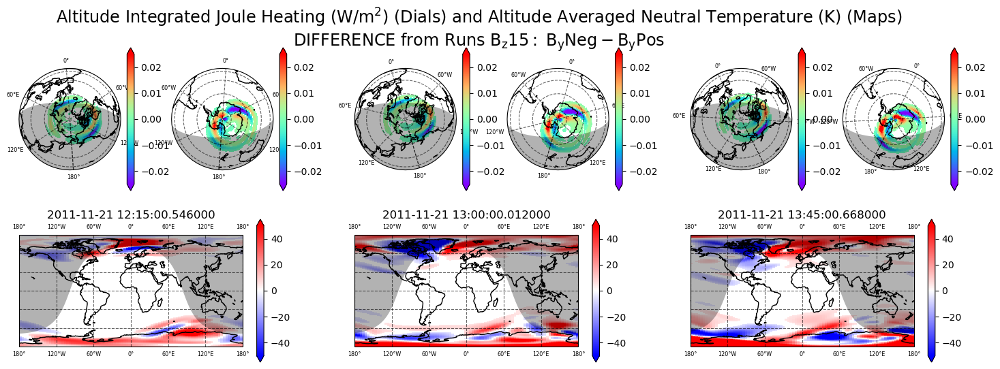

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:680: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/glade/scratch/abukowski/ipykernel_8216/2466367753.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


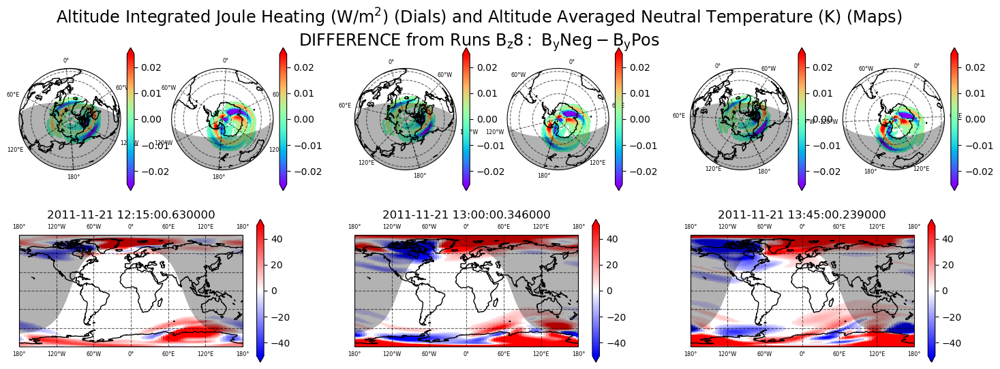

In [204]:
for i, j in [[0, 1], [3, 4]]:

    fig = plotting_routines.map_and_dials(
        (gitms[bzkeys[i]] - gitms[bzkeys[j]].reindex_like(
            gitms[bzkeys[i]], method='nearest')).AltIntJouleHeating_W_m2,
        3,
        max_per_row=3,
        time_start=pd.Timestamp('2011-11-21 12:15'),
        time_delta=pd.Timedelta('45 minutes'),
        map_da=(gitms[bzkeys[i]]
                - gitms[bzkeys[j]].reindex_like(gitms[bzkeys[i]],
                                                method='nearest')).Temperature.mean('alt'),
        mask_maps=5,
        map_cmap='bwr',
        vmin_map=-50,
        vmax_map=50,
        vmin_dial=-.025,
        vmax_dial=0.025, latlon_labeled=True)

    s = 'Altitude Integrated Joule Heating $\mathrm{(W/m^2)}$ (Dials) and '\
        'Altitude Averaged Neutral Temperature (K) (Maps)\n'\
        'DIFFERENCE from Runs $\mathrm{%s:\ %s - %s}$' % (
            bzkeys[i][bzkeys[i].find('bz'):bzkeys[i].rfind('-')].replace('b', 'B_'),
            bzkeys[i][bzkeys[i].find('by'):].replace('b', 'B_').replace('n', 'N'),
            bzkeys[j][bzkeys[j].find('by'):].replace('b', 'B_').replace('p', 'P'))

    fig.suptitle(s, fontsize='xx-large')

    fig.tight_layout()
    # fig.savefig('FinalDraftPlots/jh_and_AltAvgTempDiff-' + bzkeys[j][bzkeys[j].find('bz'):], bbox_inches='tight')
    plt.show()
    
    plt.close('all')
    # break
    # break

In [20]:
for i in bzkeys:
    print(samis[i].edens.shape)

(97, 180, 90, 40)
(97, 90, 72, 40)
(97, 90, 60, 40)
(97, 180, 90, 40)
(97, 90, 72, 40)


/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:686: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/glade/scratch/abukowski/ipykernel_11525/3458893217.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


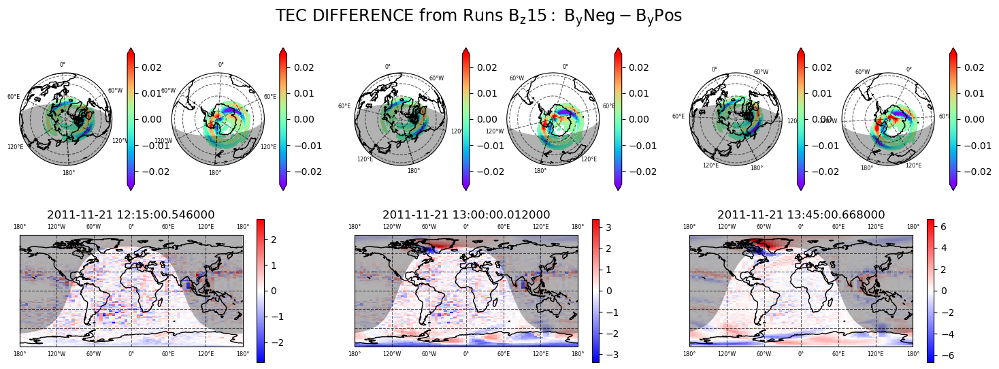

In [22]:
for i, j in [[0, 1], [3, 4]]:

    fig = plotting_routines.map_and_dials(
        (gitms[bzkeys[i]] - gitms[bzkeys[j]].reindex_like(
            gitms[bzkeys[i]], method='nearest')).AltIntJouleHeating_W_m2,
        3,
        max_per_row=3,
        time_start=pd.Timestamp('2011-11-21 12:15'),
        time_delta=pd.Timedelta('45 minutes'),
        map_da=(samis[bzkeys[i]].edens.interp_like(samis[bzkeys[1]])
                - samis[bzkeys[j]].edens.interp_like(samis[bzkeys[1]])).integrate('alt')*1e6/1e16*1e3,

        map_cmap='bwr',
        # vmin_map=-.2,
        # vmax_map=.2,
        vmin_dial=-.025,
        vmax_dial=0.025, latlon_labeled=True)

    s = 'TEC DIFFERENCE from Runs $\mathrm{%s:\ %s - %s}$' % (
       bzkeys[i][bzkeys[i].find('bz'):bzkeys[i].rfind('-')].replace('b', 'B_'),
       bzkeys[i][bzkeys[i].find('by'):].replace('b', 'B_').replace('n', 'N'),
       bzkeys[j][bzkeys[j].find('by'):].replace('b', 'B_').replace('p', 'P'))

    fig.suptitle(s, fontsize='xx-large')

    fig.tight_layout()
    # fig.savefig('FinalDraftPlots/jh_and_AltAvgTempDiff-' + bzkeys[j][bzkeys[j].find('bz'):], bbox_inches='tight')
    plt.show()
    
    plt.close('all')
    
    break

In [11]:
ds0 = xr.Dataset(coords={'lat':(np.arange(-90,90,.5)),
                         'lon':(np.arange(0,360,1))})

In [15]:
i=0
j=1

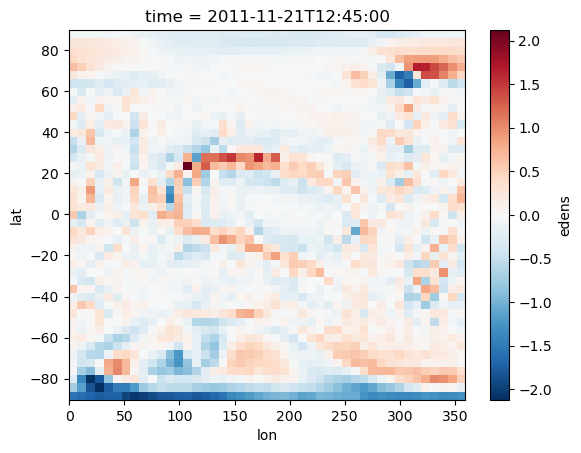

In [17]:
((samis[bzkeys[i]].edens.integrate('alt').interp_like(ds0).coarsen(lat=8, lon=8).mean()
                - samis[bzkeys[j]].edens.integrate('alt').interp_like(ds0).coarsen(lat=8,
                                                            lon=8).mean())*1e6/1e16*1e3).isel(
    time=45).plot(x='lon')

In [233]:
fig = plotting_routines.map_and_dials(
        gitms['nov-ut12-storm-on-bz17'].AltIntJouleHeating_W_m2,
        3,
        max_per_row=3,
        time_start=pd.Timestamp('2011-11-21 12:15'),
        time_delta=pd.Timedelta('45 minutes'),
        map_da=filters.filter_xarray_DA_diff(samis['nov-ut12-storm-on-bz17'].edens.sel(alt=800, method='nearest')),
        dial_cmap='rainbow',
        map_cmap='bwr', 
        vmax_dial=0.05,
        latlon_labeled=True)

s = 'Altitude Integrated Joule Heating $\mathrm{(W/m^2)}$ (Dials) and '\
    'Altitude-Averaged \nPerturbation Electron Number Density at 800km (Maps) '\
    'From Run %s' % (
        format_colname_for_title('nov-ut12-storm-on-bz17', unpack_bz=True))

fig.suptitle(s, fontsize='xx-large')

fig.tight_layout()
fig.savefig('FinalDraftPlots/SAMI-StormAmplitude/new-jh_and_edens_just-BZ17', bbox_inches='tight')
# plt.show()

plt.close('all')

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/scratch/abukowski/ipykernel_8216/2113225779.py:20: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


In [231]:
for i, j in [[0, 1], [3, 4]]:

    fig = plotting_routines.map_and_dials(
        (gitms[bzkeys[i]] - gitms[bzkeys[j]].reindex_like(
            gitms[bzkeys[i]], method='nearest')).AltIntJouleHeating_W_m2,
        3,
        max_per_row=3,
        time_start=pd.Timestamp('2011-11-21 12:15'),
        time_delta=pd.Timedelta('45 minutes'),
        map_da=(samis[bzkeys[i]]
                - samis[bzkeys[j]].reindex_like(samis[bzkeys[i]],
                                                method='nearest')).edens.sel(alt=800, method='nearest'),
        # mask_maps=5,
        map_cmap='bwr',
        vmin_dial=-.025,
        vmin_map=-7500,vmax_map=7500,
        vmax_dial=0.025, latlon_labeled=True)

    s = 'Altitude Integrated Joule Heating $\mathrm{(W/m^2)}$ (Dials) and '\
        'Electron Number Density at 800km (Maps)\n'\
        'DIFFERENCE from Runs $\mathrm{%s:\ %s - %s}$' % (
            bzkeys[i][bzkeys[i].find('bz'):bzkeys[i].rfind('-')].replace('b', 'B_'),
            bzkeys[i][bzkeys[i].find('by'):].replace('b', 'B_').replace('n', 'N'),
            bzkeys[j][bzkeys[j].find('by'):].replace('b', 'B_').replace('p', 'P'))

    fig.suptitle(s, fontsize='xx-large')

    fig.tight_layout()
    fig.savefig('FinalDraftPlots/SAMI-StormAmplitude/send2phil-inposter-' + bzkeys[j][bzkeys[j].find('bz'):], bbox_inches='tight')
    # plt.show()
    
    plt.close('all')
    # break
    # break

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/scratch/abukowski/ipykernel_8216/2276599206.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/scratch/abukowski/ipykernel_8216/2276599206.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


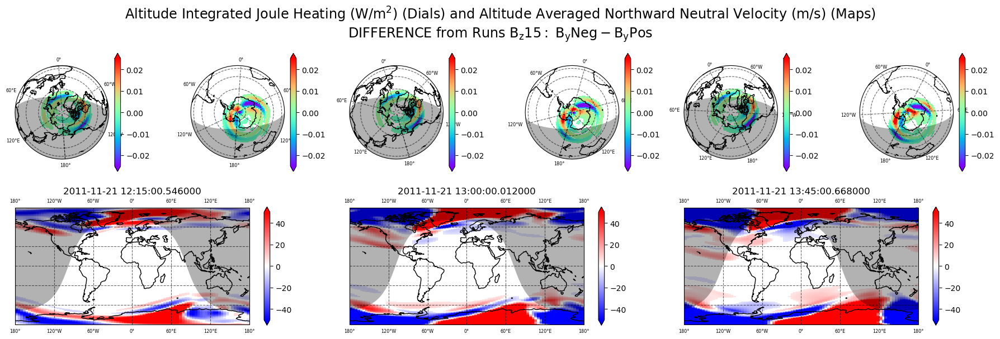

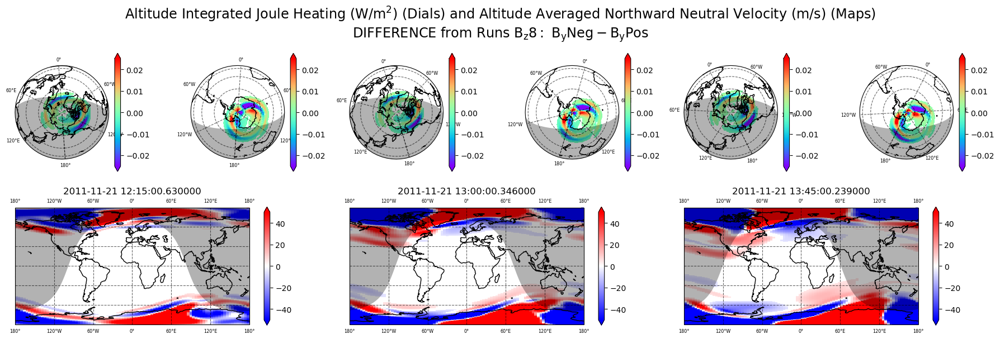

In [55]:
    
for i, j in [[0, 1], [3, 4]]:

    fig = plotting_routines.map_and_dials(
        (gitms[bzkeys[i]] - gitms[bzkeys[j]].reindex_like(
            gitms[bzkeys[i]], method='nearest')).AltIntJouleHeating_W_m2,
        3,
        max_per_row=3,
        time_start=pd.Timestamp('2011-11-21 12:15'),
        time_delta=pd.Timedelta('45 minutes'),
        map_da=(gitms[bzkeys[i]]
                - gitms[bzkeys[j]].reindex_like(gitms[bzkeys[i]],
                                                method='nearest')).Vn_north.mean('alt'),
        mask_maps=5,
        map_cmap='bwr',
        vmin_map=-50,
        vmax_map=50,
        vmin_dial=-.025,
        vmax_dial=0.025, latlon_labeled=True)

    s = 'Altitude Integrated Joule Heating $\mathrm{(W/m^2)}$ (Dials) and '\
        'Altitude Averaged Northward Neutral Velocity (m/s) (Maps)\n'\
        'DIFFERENCE from Runs $\mathrm{%s:\ %s - %s}$' % (
            bzkeys[i][bzkeys[i].find('bz'):bzkeys[i].rfind('-')].replace('b', 'B_'),
            bzkeys[i][bzkeys[i].find('by'):].replace('b', 'B_').replace('n', 'N'),
            bzkeys[j][bzkeys[j].find('by'):].replace('b', 'B_').replace('p', 'P'))

    fig.suptitle(s, fontsize='xx-large')

    fig.tight_layout()
    fig.savefig('FinalDraftPlots/jh_and_AltAvgVnNorthDiff-' + bzkeys[j][bzkeys[j].find('bz'):], bbox_inches='tight')
    plt.show()
    
    plt.close('all')

In [191]:
for i, j in [[0, 1], [3, 4]]:
    print()

$\mathrm{B_z=-15,\ B_y=-8}$
$\mathrm{B_z=-8,\ B_y=-15}$


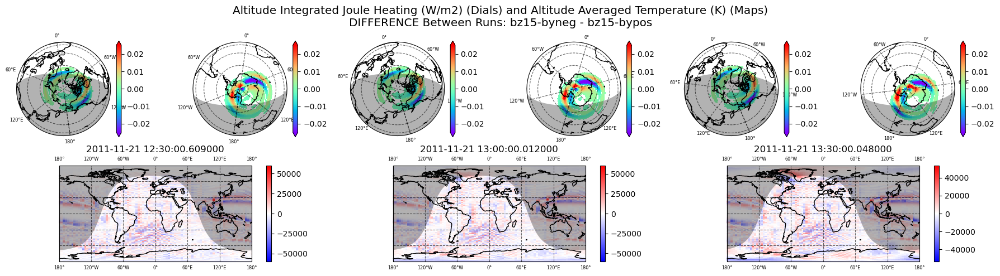

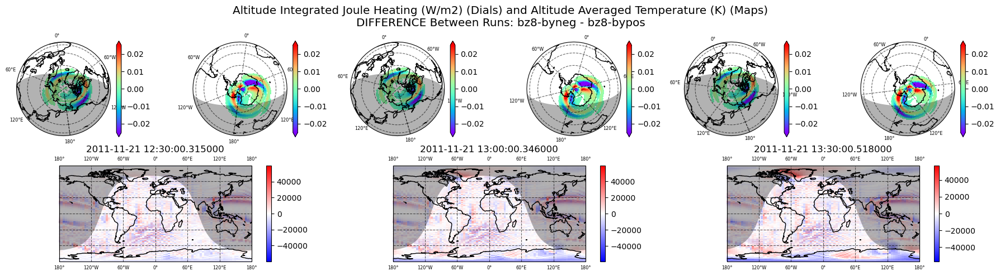

In [67]:
for i, j in [[0, 1], [3, 4]]:
    
    fig = plotting_routines.map_and_dials(
        (gitms[bzkeys[i]]- gitms[bzkeys[j]].reindex_like(
             gitms[bzkeys[i]], method='nearest')).AltIntJouleHeating_W_m2,
        3,
        max_per_row=3,
        time_start=pd.Timestamp('2011-11-21 12:30'),
        time_delta=pd.Timedelta('30 minutes'),
        map_da=(samis[bzkeys[i]] 
                - samis[bzkeys[j]].reindex_like(samis[bzkeys[i]],
                                                method='nearest')).edens.mean('alt'),
        # mask_maps=5,
        map_cmap='bwr',
        # vmin_map=-50,
        # vmax_map=50,
        vmin_dial=-.025,
        vmax_dial=0.025,latlon_labeled=True)
    
    fig.suptitle('Altitude Integrated Joule Heating (W/m2) (Dials) and Altitude Averaged Temperature (K) (Maps)\n'
        'DIFFERENCE Between Runs: %s - %s' % (
            format_colname_for_title(bzkeys[i], unpack_bz=True),
            format_colname_for_title(bzkeys[i], unpack_bz=True)),
                 fontsize='x-large')
    fig.tight_layout()
    fig.show()# savefig('good-plots/jh-rotb/jh_and_edensdiff-' + bzkeys[j][bzkeys[j].find('bz'):], bbox_inches='tight')
    # break

## Amplitude:

In [57]:
ampkeys = ['may-ut12-storm-on-full', 'may-ut12-storm-on-half',
           'nov-ut12-storm-on-full', 'nov-ut12-storm-on-half']

In [77]:
plotting_routines = importlib.reload(plotting_routines)

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [80]:
itime = 54
a = 450
times = []


map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []

for k in ampkeys:
    
    newkey = format_colname_for_title(k).replace('Storm On ', '')
    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)#.reindex_like(gitms['may-full'], fill_value=19)
    map_data[newkey] = filters.filter_xarray_DA_diff(
        samis[k].edens.sel(alt=a, method='nearest'),
        percent=False,
        label='lower',
        order=2).isel(time=itime)
    times.append(samis[k].time.values[itime])
    
    

fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        suptitle=
                                      'Joule Heating $\mathrm{(W/m^2)}$ and Perturbation Neutral Velocity (m/s North) at %i km'
                                      '\nSeveral Runs at 13:30 (1.5 hrs after onset)' %(a),
                                      suptitlesize='xx-large',
                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-12, vmax_map=12,
                                      several_datasets=True, times_datasets=times)
    
fig.savefig('FinalDraftPlots/GITM-StormAmplitude/jh_and_VnNorth', bbox_inches='tight')
# fig.show()
# raise ValueError

plt.close()


map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []

for k in ampkeys:
    
    newkey = format_colname_for_title(k).replace('Storm On ', '')

    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)
    map_data[newkey] = filters.filter_xarray_DA_diff(
        gitms[k].Vn_east.sel(alt=a, method='nearest'), percent=False, label='lower', order=2).isel(time=itime)
    times.append(gitms[k].time.values[itime])
    

fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        suptitle=
                                      'Joule Heating $\mathrm{(W/m^2)}$ and Perturbation Neutral Velocity (m/s East) at %i km \n Several Runs at 13:30 (1.5 hrs after onset)' %(a),                                      
                                      suptitlesize='xx-large',

                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-12, vmax_map=12, 
                                      several_datasets=True, times_datasets=times)
    
fig.savefig('FinalDraftPlots/GITM-StormAmplitude/jh_and_VnEast', bbox_inches='tight')

plt.close()


map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []

for k in ampkeys:
    
    newkey = newkey = format_colname_for_title(k).replace('Storm On ', '')

    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)
    map_data[newkey] = filters.filter_xarray_DA_diff(
        gitms[k].Temperature.sel(alt=a, method='nearest'), percent=False, label='lower', order=2).isel(time=itime)
    times.append(gitms[k].time.values[itime])
    

fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        suptitle=
                                      'Joule Heating $\mathrm{(W/m^2)}$ and Perturbation Neutral Temperature (K) at %i km from Several Runs at 13:30 (1.5 hrs after onset)' %(a),
                                      suptitlesize='xx-large',
                                      
                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-12, vmax_map=12, 
                                      several_datasets=True, times_datasets=times)
    
fig.savefig('FinalDraftPlots/GITM-StormAmplitude/jh_and_Tneut', bbox_inches='tight')

plt.close()

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:680: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(pad=0.5)
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:680: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(pad=0.5)
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:680: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(pad=0.5)


In [227]:
itime = 54
a = 450
times = []


map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []

for k in ampkeys:
    
    newkey = format_colname_for_title(k).replace('Storm On ', '')
    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)#.reindex_like(gitms['may-full'], fill_value=19)
    map_data[newkey] = filters.filter_xarray_DA_diff(
        gitms[k].Vn_north.sel(alt=a, method='nearest'),
        percent=False,
        label='lower',
        order=2).isel(time=itime)
    times.append(gitms[k].time.values[itime])
    
    

fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        suptitle=
                                      'Joule Heating $\mathrm{(W/m^2)}$ and Perturbation Neutral Velocity (m/s North) at %i km'
                                      '\nSeveral Runs at 13:30 (1.5 hrs after onset)' %(a),
                                      suptitlesize='xx-large',
                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-12, vmax_map=12,
                                      several_datasets=True, times_datasets=times)
    
fig.savefig('FinalDraftPlots/GITM-StormAmplitude/jh_and_VnNorth', bbox_inches='tight')
# fig.show()
# raise ValueError

plt.close()


map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []

for k in ampkeys:
    
    newkey = format_colname_for_title(k).replace('Storm On ', '')

    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)
    map_data[newkey] = filters.filter_xarray_DA_diff(
        gitms[k].Vn_east.sel(alt=a, method='nearest'), percent=False, label='lower', order=2).isel(time=itime)
    times.append(gitms[k].time.values[itime])
    

fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        suptitle=
                                      'Joule Heating $\mathrm{(W/m^2)}$ and Perturbation Neutral Velocity (m/s East) at %i km \n Several Runs at 13:30 (1.5 hrs after onset)' %(a),                                      
                                      suptitlesize='xx-large',

                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-12, vmax_map=12, 
                                      several_datasets=True, times_datasets=times)
    
fig.savefig('FinalDraftPlots/GITM-StormAmplitude/jh_and_VnEast', bbox_inches='tight')

plt.close()


map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []

for k in ampkeys:
    
    newkey = newkey = format_colname_for_title(k).replace('Storm On ', '')

    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)
    map_data[newkey] = filters.filter_xarray_DA_diff(
        gitms[k].Temperature.sel(alt=a, method='nearest'), percent=False, label='lower', order=2).isel(time=itime)
    times.append(gitms[k].time.values[itime])
    

fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=3, mask_dials=0.002,
                                        suptitle=
                                      'Joule Heating $\mathrm{(W/m^2)}$ and Perturbation Neutral Temperature (K) at %i km from Several Runs at 13:30 (1.5 hrs after onset)' %(a),
                                      suptitlesize='xx-large',
                                      
                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-12, vmax_map=12, 
                                      several_datasets=True, times_datasets=times)
    
fig.savefig('FinalDraftPlots/GITM-StormAmplitude/jh_and_Tneut', bbox_inches='tight')

plt.close()

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:


In [92]:
for k in ampkeys:
    
    print(samis[k].time.min().values)
    
    

2011-05-21T09:00:00.000000000
2011-05-21T09:00:00.000000000
2011-11-21T09:00:00.000000000
2011-11-21T09:00:00.000000000


In [226]:
itime = 54
# a = 450
alts = [200, 350, 500, 850]
times = []


map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []
first=True


for a in alts:
    for k in np.flip(ampkeys):

        newkey = format_colname_for_title(k).replace('Storm On ', '')
        dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)#.reindex_like(gitms['may-full'], fill_value=19)
        if first:
            map_data[newkey] = filters.filter_xarray_DA_diff(
            samis[k].edens.sel(alt=a, method='nearest'),
            percent=False,
            label='lower',
            order=2).sel(time=samis[k].time.min() + pd.Timedelta('4.5 hours'),
                         method='nearest')
            first=False
        else:
            map_data[newkey] = filters.filter_xarray_DA_diff(
                samis[k].edens.sel(alt=a, method='nearest'),
                percent=False,
                label='lower',
                order=2).sel(time=samis[k].time.min() + pd.Timedelta('4.5 hours'),
                             method='nearest').interp_like(map_data)
        times.append(gitms[k].time.values[itime])



    fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                            total=3,
                                            map_da=map_data,
                                            max_per_row=3, mask_dials=0.002,
                                            suptitle=
                                          'Joule Heating $\mathrm{(W/m^2)}$ and Perturbation Electron Number Density at %i km'
                                          '\nSeveral Runs at 13:30 (1.5 hrs after onset)' %(a),
                                          suptitlesize='xx-large',
                                            map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-3000, vmax_map=3000,
                                          several_datasets=True, times_datasets=times)

    fig.savefig('FinalDraftPlots/SAMI-StormAmplitude/new-edens_at-%i' %a, bbox_inches='tight')
    # fig.show()
    # raise ValueError

    plt.close()



/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:
/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:


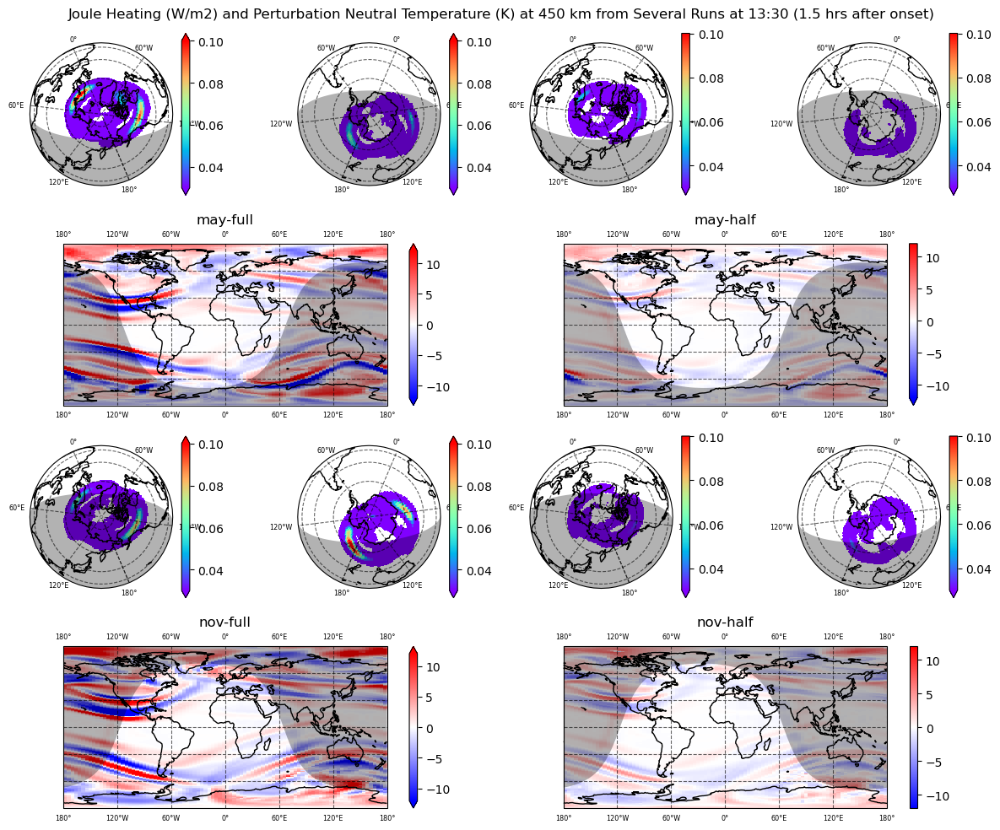

In [43]:
map_data = xr.Dataset()
dial_data = xr.Dataset()
titles = []

for k in ampkeys:
    
    newkey = '-'.join([k.split('-')[0], k.split('-')[-1]])

    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)
    map_data[newkey] = filters.filter_xarray_DA_diff(
        gitms[k].Temperature.sel(alt=a, method='nearest'), percent=False, label='lower', order=2).isel(time=itime)
    times.append(gitms[k].time.values[itime])
    

fig = plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        suptitle='Joule Heating (W/m2) and Perturbation Neutral Temperature (K) at %i km from Several Runs at 13:30 (1.5 hrs after onset)' %(a),
                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-12, vmax_map=12, 
                                      several_datasets=True, times_datasets=times, latlon_labeled=True)
    
fig.show()
fig.savefig('good-plots/jh-temp-gitm-amplitude_and_season')




In [165]:
for i in gitms.keys():
    print(format_colname_for_title(i))

May UT12 Storm 1hr Full
May UT12 Storm On Full
May UT18 Storm On Full
May UT6 Storm 1hr Full
May UT6 Storm On Full
May UT12 Storm 1hr Half
May UT12 Storm On Half
May UT12 Storm On Quarter
Nov UT12 Storm On Full
Nov UT18 Storm On Full
Nov UT6 Storm On Full
Nov UT12 Storm On Half
$\mathrm{Nov\ UT12\ Storm\ On\ B_z=-15,\ B_y=Negative}$
$\mathrm{Nov\ UT12\ Storm\ On\ B_z=-15,\ B_y=Positive}$
$\mathrm{Nov\ UT12\ Storm\ On\ B_z=-17}$
$\mathrm{Nov\ UT12\ Storm\ On\ B_z=-8,\ B_y=Negative}$
$\mathrm{Nov\ UT12\ Storm\ On\ B_z=-8,\ B_y=Positive}$


In [177]:
plotting_routines = importlib.reload(plotting_routines)

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [178]:
plt.close('all')

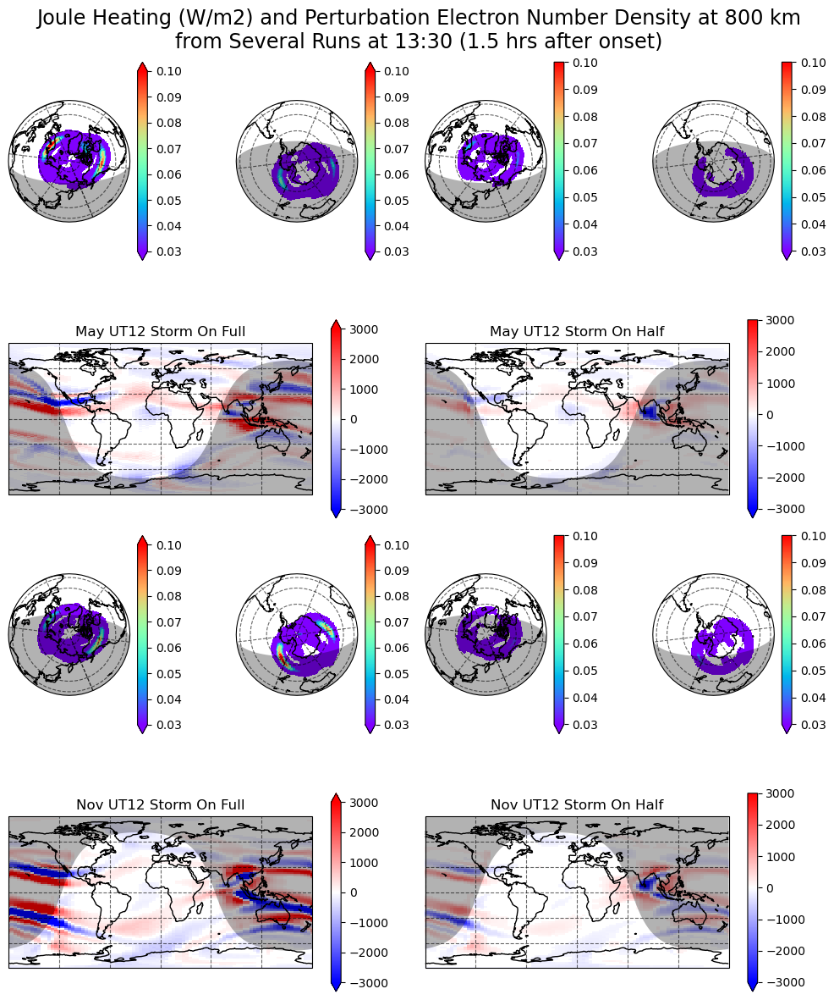

In [179]:
itime = 54
a = 800
times = []


ampkeys = ['may-ut12-storm-on-full', 'may-ut12-storm-on-half',
           'nov-ut12-storm-on-full', 'nov-ut12-storm-on-half',
          ]


map_data = xr.Dataset()
dial_data = xr.Dataset()

for k in ampkeys:
    
    newkey = format_colname_for_title(k)
    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)#.reindex_like(gitms['may-full'], fill_value=19)
    
    if len(map_data.data_vars) ==0:
        map_data[newkey] = filters.filter_xarray_DA_diff(
            samis[k].edens.sel(alt=a, method='nearest'),
            percent=False,
            label='lower',
            order=2).isel(time=itime)
    else:
        map_data[newkey] = filters.filter_xarray_DA_diff(
            samis[k].edens.sel(alt=a, method='nearest'),
            percent=False,
            label='lower',
            order=2).isel(time=itime).reindex_like(map_data, method='nearest')
    times.append(samis[k].time.values[itime])
    
    

fig =  plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=4,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        
                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-3000, vmax_map=3000,
                                       mask_maps=100,
                                       several_datasets=True,
                                       times_datasets=times,
                                       suptitle='Joule Heating (W/m2) and Perturbation Electron Number Density at %i km\nfrom Several Runs at 13:30 (1.5 hrs after onset)' %(a),
                                       suptitlesize='xx-large')

# fig.tight_layout()


# fig.subplots_adjust(
#                     wspace=0.1, hspace=0.5)

fig.show()



fig.savefig('good-plots/jh-edens-800km_amp-n-season.pdf')#, bbox_inches='tight', )



In [180]:
fig.subplots_adjust(hspace=2)
fig.tight_layout()

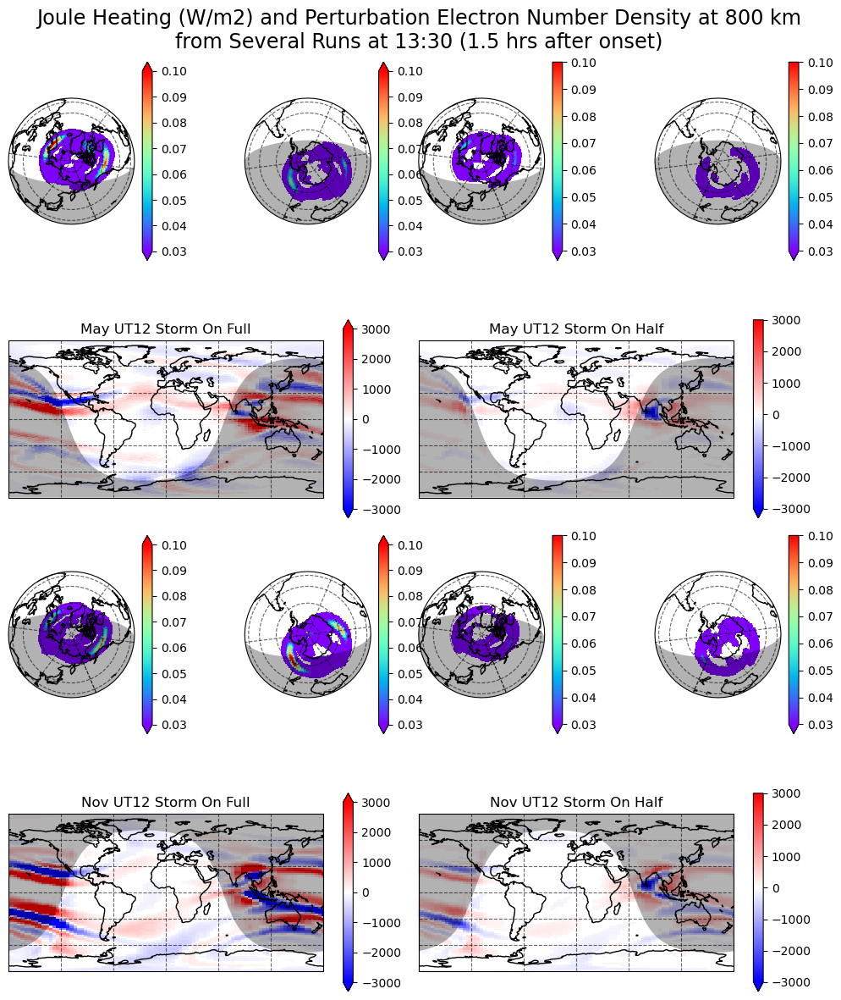

In [181]:
fig

In [52]:
del fig

/glade/u/home/abukowski/Documents/CEDAR2023/utility_programs/plotting_routines.py:682: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  if save is not None:


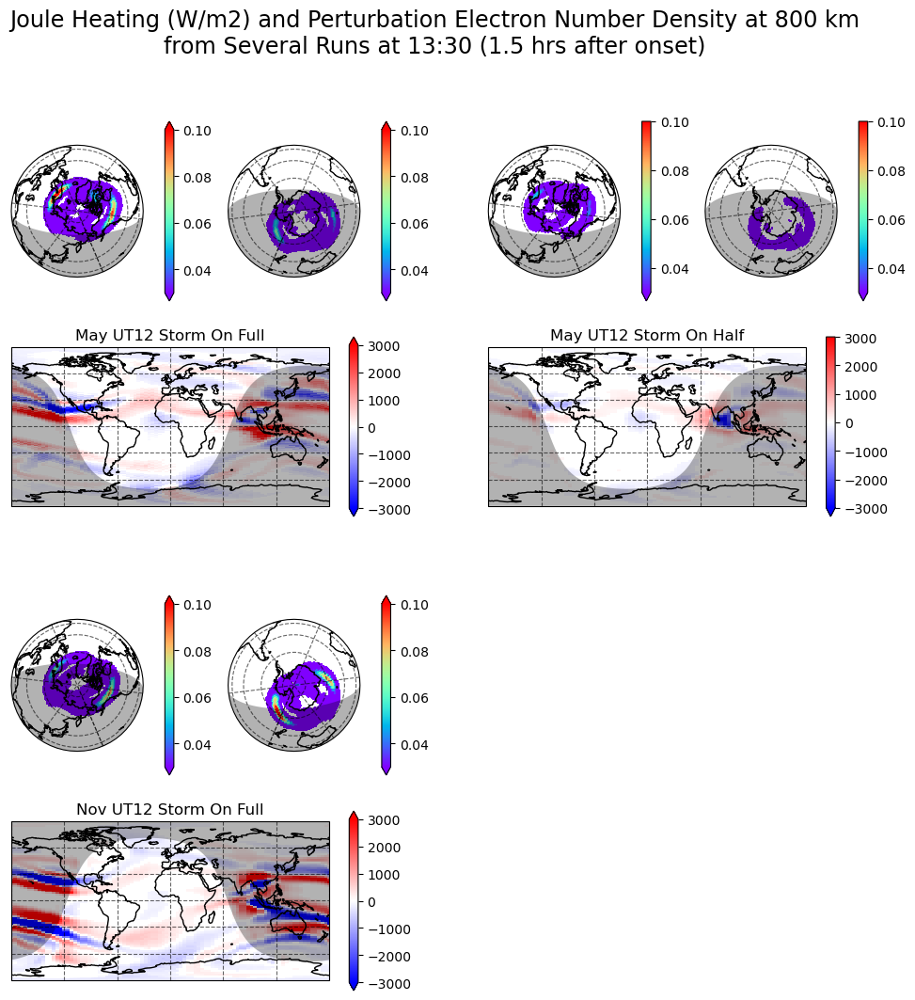

In [224]:
itime = 54
a = 800
times = []


ampkeys = ['may-ut12-storm-on-full', 'may-ut12-storm-on-half',
           'nov-ut12-storm-on-full', 'nov-ut12-storm-on-half']


map_data = xr.Dataset()
dial_data = xr.Dataset()

for k in ampkeys:
    
    newkey = format_colname_for_title(k)
    dial_data[newkey] = gitms[k].AltIntJouleHeating_W_m2.isel(time=itime)#.reindex_like(gitms['may-full'], fill_value=19)
    
    if len(map_data.data_vars) ==0:
        map_data[newkey] = filters.filter_xarray_DA_diff(
            samis[k].edens.sel(alt=a, method='nearest'),
            percent=False,
            label='lower',
            order=2).isel(time=itime)
    else:
        map_data[newkey] = filters.filter_xarray_DA_diff(
            samis[k].edens.sel(alt=a, method='nearest'),
            percent=False,
            label='lower',
            order=2).isel(time=itime).reindex_like(map_data, method='nearest')
    times.append(samis[k].time.values[itime])
    
    

fig =  plotting_routines.map_and_dials(dial_da=dial_data,
                                        total=3,
                                        map_da=map_data,
                                        max_per_row=2, mask_dials=0.002,
                                        
                                        map_cmap='bwr', vmin_dial=0.03, vmax_dial=.10, vmin_map=-3000, vmax_map=3000,
                                       mask_maps=100,
                                       several_datasets=True,
                                       times_datasets=times,
                                       suptitle='Joule Heating (W/m2) and Perturbation Electron Number Density at %i km\nfrom Several Runs at 13:30 (1.5 hrs after onset)' %(a),
                                       suptitlesize='xx-large')

# fig.tight_layout()

# fig.show()



fig.savefig('FinalDraftPlots/SAMI-StormAmplitude/new-edens-800.pdf', bbox_inches='tight')

fig.savefig('FinalDraftPlots/SAMI-StormAmplitude/new-edens-800.png', bbox_inches='tight')


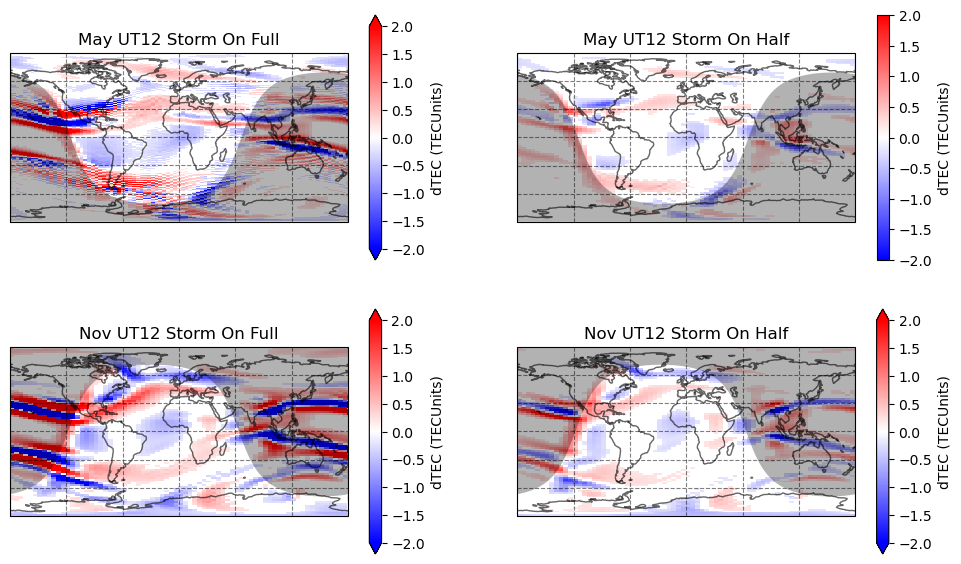

In [183]:
fig, axs = plt.subplots(2, 2,figsize=[12,7], subplot_kw={'projection':ccrs.PlateCarree()})

for i, ax in enumerate(axs.flatten()):
    
    d = filters.filter_xarray_DA_diff(
            samis[ampkeys[i]].edens.integrate('alt'),
            percent=False,
            label='lower',
            order=2)/1e6
    d.where(np.abs(d) > .2).isel(time=itime).plot(ax=ax, 
                                                  vmin=-2, vmax=2, 
                                                  transform=ccrs.PlateCarree(),
                                                  cmap='bwr', cbar_kwargs={'label':'dTEC (TECUnits)'})
    ax.set_title(format_colname_for_title(ampkeys[i]))
    ax.coastlines(alpha=0.6)
    ax.gridlines(color='black', alpha=0.5, linestyle='--')
    ax.add_feature(Nightshade(pd.Timestamp(d.isel(time=itime).time.values)), alpha=0.3)
fig.show()

In [184]:
samis['may-ut18-storm-on-full'].data_vars

Data variables:
    edens           (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    h+dens          (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    o+dens          (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    n+odens         (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    o2+dens         (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    he+dens         (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    n2+dens         (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    n+dens          (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    hdens           (time, lat, lon, alt) float64 dask.array<chunksize=(97, 90, 72, 40), meta=np.ndarray>
    odens           (time, lat

In [185]:
gitms.keys()

dict_keys(['may-ut12-storm-1hr-full', 'may-ut12-storm-on-full', 'may-ut18-storm-on-full', 'may-ut6-storm-1hr-full', 'may-ut6-storm-on-full', 'may-ut12-storm-1hr-half', 'may-ut12-storm-on-half', 'may-ut12-storm-on-quarter', 'nov-ut12-storm-on-full', 'nov-ut18-storm-on-full', 'nov-ut6-storm-on-full', 'nov-ut12-storm-on-half', 'nov-ut12-storm-on-bz15-byneg', 'nov-ut12-storm-on-bz15-bypos', 'nov-ut12-storm-on-bz17', 'nov-ut12-storm-on-bz8-byneg', 'nov-ut12-storm-on-bz8-bypos'])

In [186]:
samis.keys()

dict_keys(['may-ut12-storm-on-full', 'may-ut18-storm-on-full', 'may-ut6-storm-on-full', 'may-ut12-storm-on-half', 'may-ut12-storm-on-quarter', 'nov-ut12-storm-on-full', 'nov-ut18-storm-on-full', 'nov-ut6-storm-on-full', 'nov-ut12-storm-on-half', 'nov-ut12-storm-on-bz15-byneg', 'nov-ut12-storm-on-bz15-bypos', 'nov-ut12-storm-on-bz17', 'nov-ut12-storm-on-bz8-byneg', 'nov-ut12-storm-on-bz8-bypos'])

In [111]:
from matplotlib.dates import DateFormatter, AutoDateLocator, AutoDateFormatter


In [110]:
utkeys = [['may-ut12-storm-on-full', 'may-ut18-storm-on-full', 'may-ut6-storm-on-full'],
         ['nov-ut12-storm-on-full', 'nov-ut18-storm-on-full', 'nov-ut6-storm-on-full']]



In [112]:
xtick_locator = AutoDateLocator(maxticks=5)
xtick_formatter = AutoDateFormatter(xtick_locator)


In [113]:
lts_to_keo = [6,12,18,23.9]


In [114]:
from utility_programs import utils


In [115]:
utils = importlib.reload(utils)


In [118]:
alts

[200, 350, 500, 850]

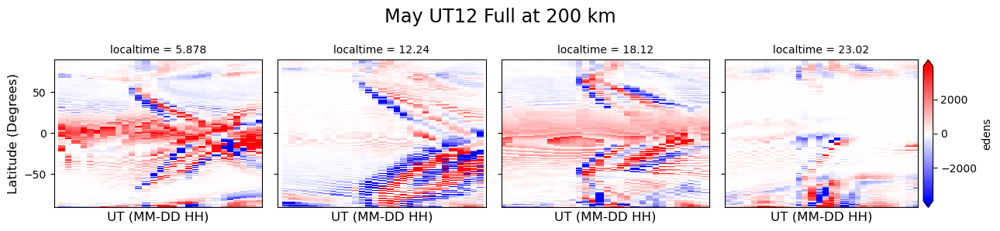

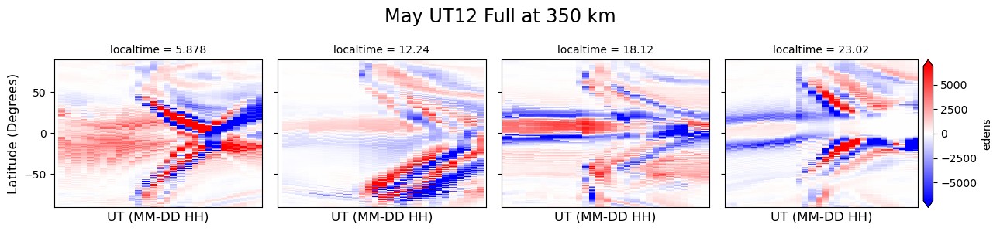

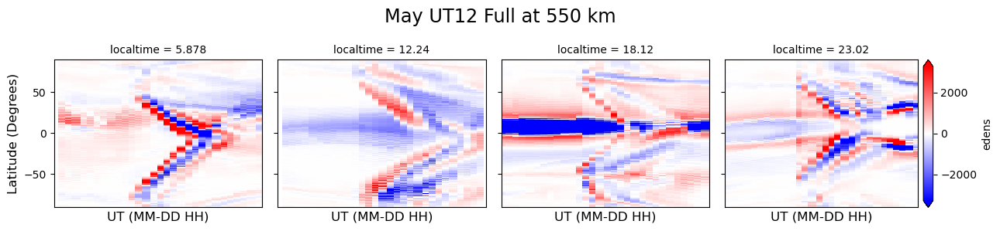

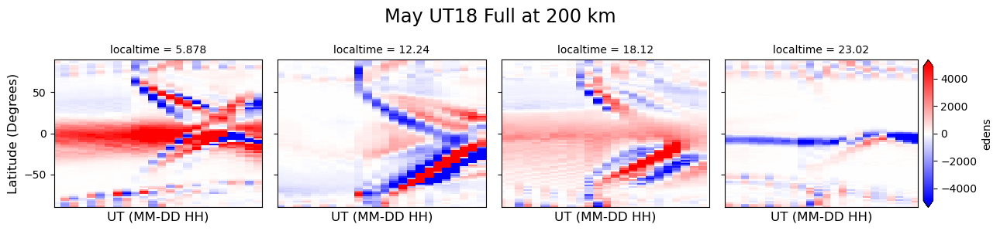

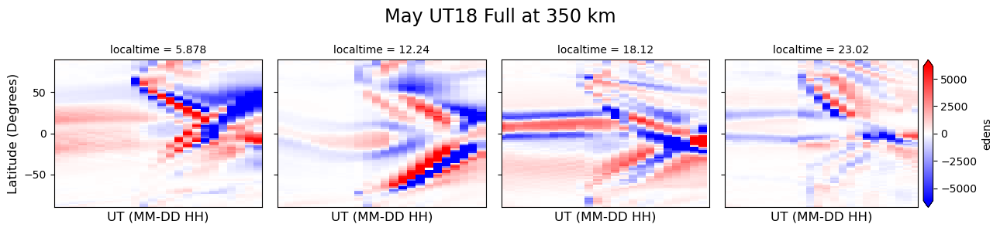

...

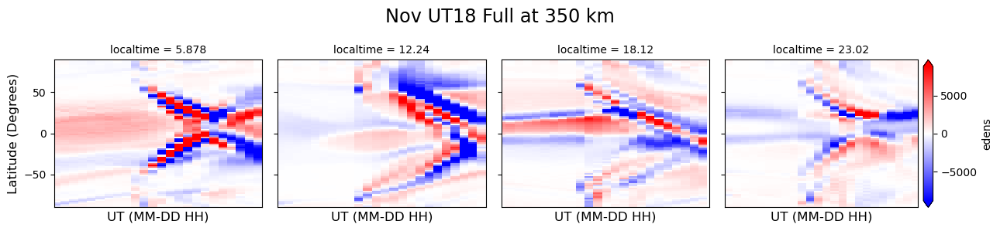

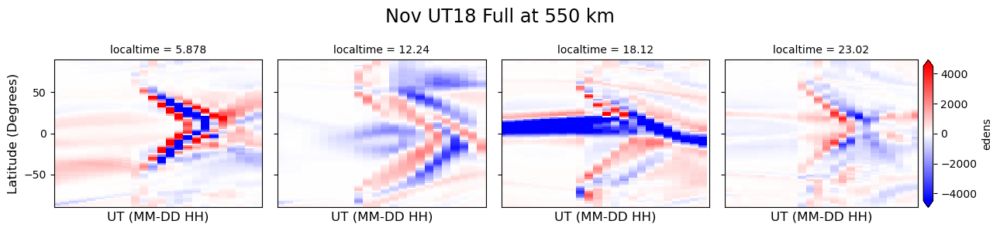

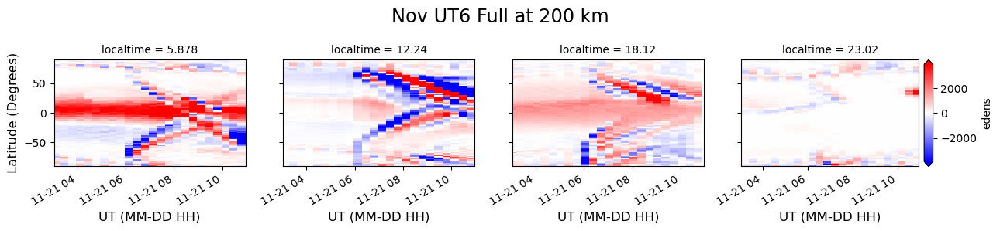

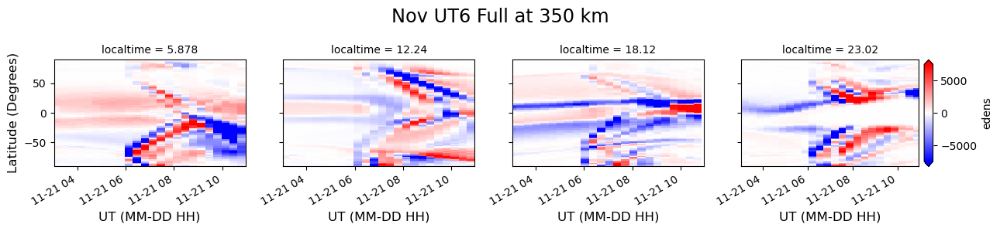

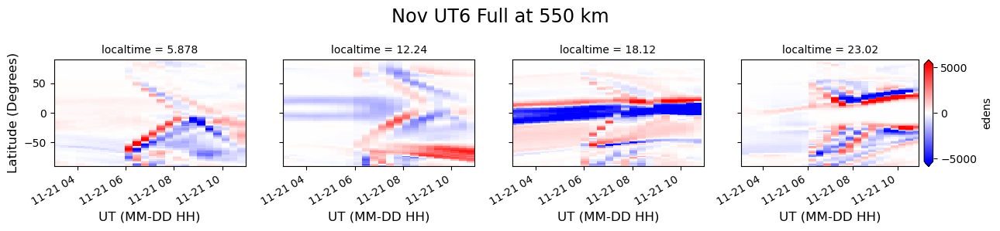

In [216]:
alts = [200, 350, 550]

for mn in utkeys:
    # fig, axs = plt.subplots(3,1, figsize=(10,10))
    for i, run in enumerate(mn):
        for a in alts:
            fig = utils.add_lt_to_dataset(filters.filter_xarray_DA_diff(
                samis[run].edens.sel(alt=a, method='nearest'))
                              ,localtimes=48).sel(localtime=lts_to_keo,
                                                    method='nearest').plot(col='localtime',
                                                                           col_wrap = 4,
                                                                           x='time', robust=True,
                                                                           cmap='bwr', add_colorbar=False,
                                                                           sharey=True)
            fig.set_xlabels('UT (MM-DD HH)', fontsize='large')
            fig.set_ylabels("Latitude (Degrees)", fontsize='large')

            for ax in fig.axs.flatten():
                ax.xaxis.set_major_locator(xtick_locator)
                # ax.set_xticks( set_ticks(max_xticks=6)
                ax.xaxis.set_major_formatter(xtick_formatter)

            divider = make_axes_locatable(plt.gca())
            cax = divider.append_axes("right", "5%", pad="3%")
            fig.add_colorbar(cax=cax, )
            fig.fig.suptitle(format_colname_for_title(run).replace('Storm On ', '') + ' at %i km'%a, fontsize='xx-large')
            fig.fig.set_layout_engine('tight', )
            plt.savefig('FinalDraftPlots/onset_lt_sami/'+run+'-'+str(a), bbox_inches='tight')#show()

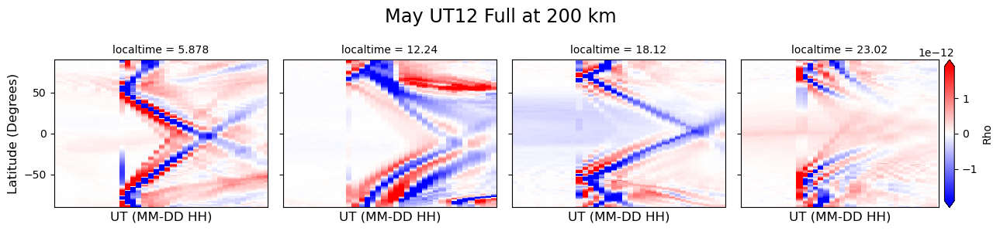

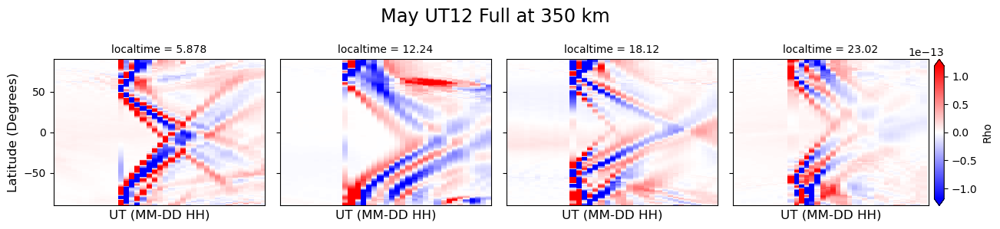

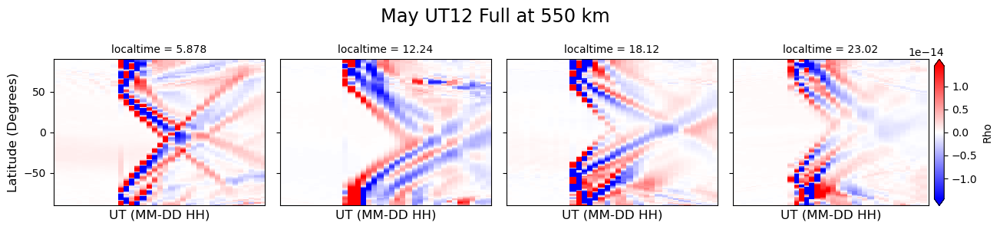

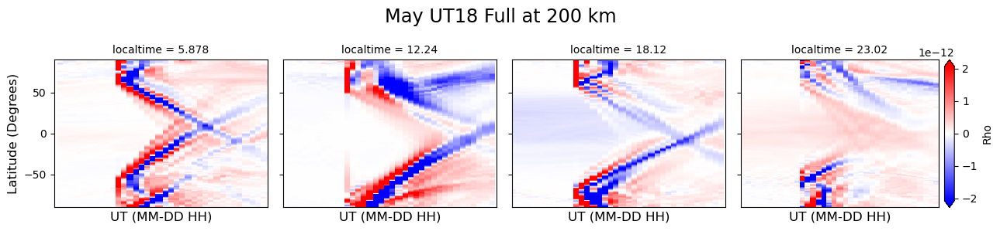

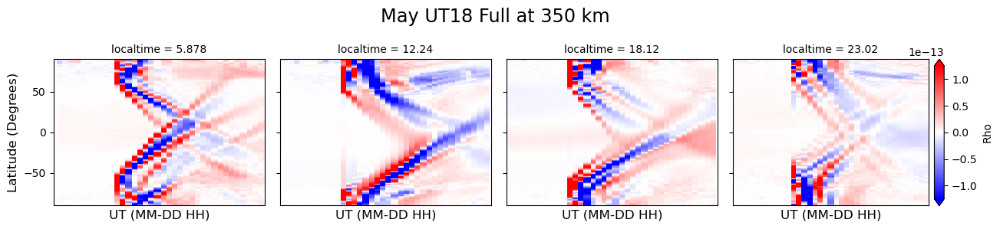

...

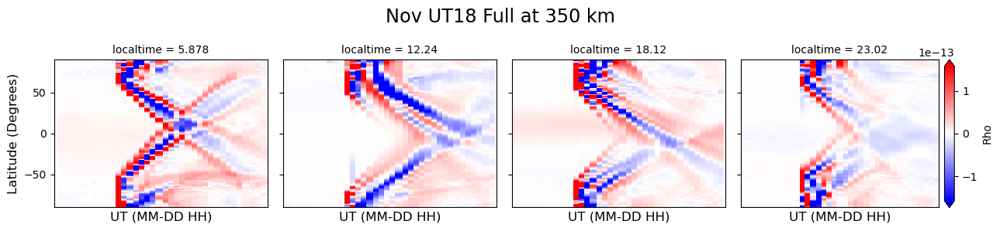

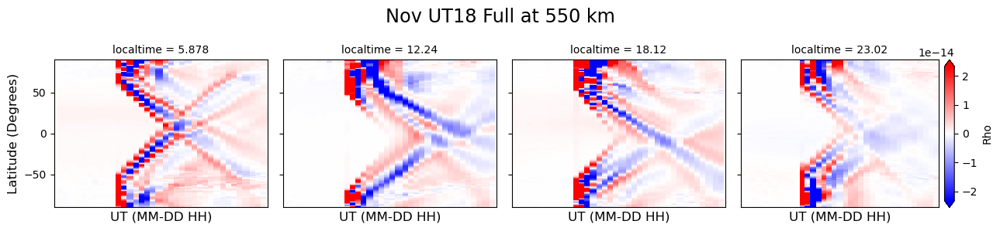

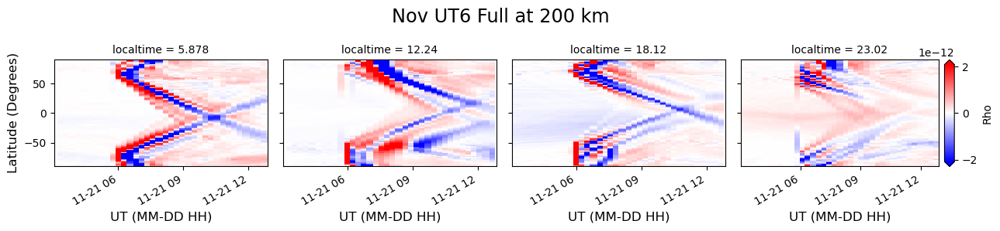

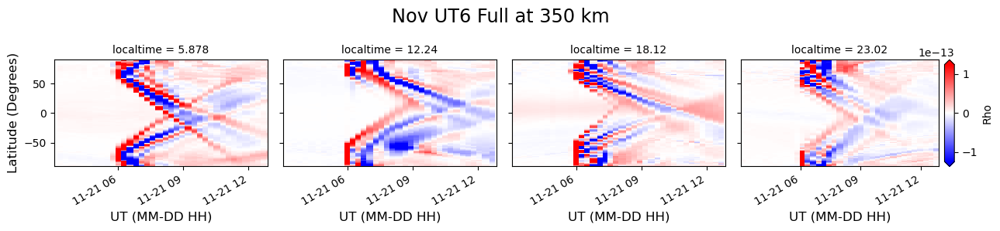

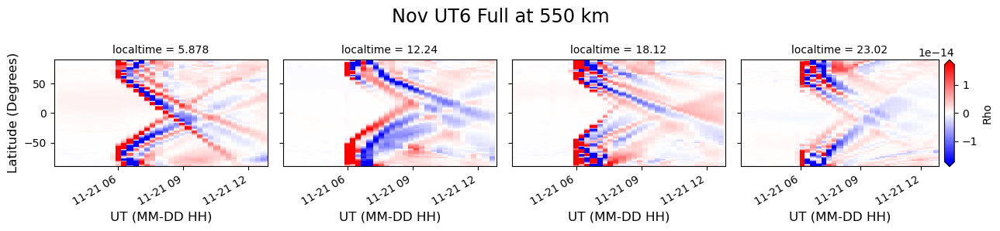

In [121]:

alts = [200, 350, 550]

for mn in utkeys:
    # fig, axs = plt.subplots(3,1, figsize=(10,10))
    for i, run in enumerate(mn):
        for a in alts:
            fig = utils.add_lt_to_dataset(filters.filter_xarray_DA_diff(
                gitms[run].Rho.sel(alt=a, method='nearest'))
                              ,localtimes=48).sel(localtime=lts_to_keo,
                                                    method='nearest').plot(col='localtime',
                                                                           col_wrap = 4,
                                                                           x='time', robust=True,
                                                                           cmap='bwr', add_colorbar=False,
                                                                           sharey=True)
            fig.set_xlabels('UT (MM-DD HH)', fontsize='large')
            fig.set_ylabels("Latitude (Degrees)", fontsize='large')

            for ax in fig.axs.flatten():
                ax.xaxis.set_major_locator(xtick_locator)
                # ax.set_xticks( set_ticks(max_xticks=6)
                ax.xaxis.set_major_formatter(xtick_formatter)

            divider = make_axes_locatable(plt.gca())
            cax = divider.append_axes("right", "5%", pad="3%")
            fig.add_colorbar(cax=cax, )
            fig.fig.suptitle(format_colname_for_title(run).replace('Storm On ', '') + ' at %i km'%a, fontsize='xx-large')
            fig.fig.set_layout_engine('tight', )
            plt.savefig('FinalDraftPlots/Onset_LT-Keos-Rho/'+run+'-'+str(a), bbox_inches='tight')#show()
            # plt.show()
            # break
        # break
    # break
    

In [199]:
for run in gitms.keys():
    
    if 'hr' in run and run.replace('1hr', 'on') in gitms.keys():
        print(run)

may-ut12-storm-1hr-full
may-ut6-storm-1hr-full
may-ut12-storm-1hr-half


In [201]:
with tqdm(total=9*3) as pbar:

    for run in gitms.keys():

        if 'hr' in run and run.replace('1hr', 'on') in gitms.keys():
            for alt_now in [250, 400, 600]:
                for col in ['Rho','Vn_east','Vn_north']:
                    fig = utils.add_lt_to_dataset(filters.filter_xarray_DA_diff(
                        gitms[run][col].sel(alt=alt_now, method='nearest'))
                                      ,localtimes = 90).sel(localtime=lts_to_keo,
                                                            method='nearest').plot(col='localtime',
                                                                                   col_wrap = 4,
                                                                                   x='time', 
                                                                                   robust=True,
                                                                                   cmap='bwr', 
                                                                                   add_colorbar=False,
                                                                                  sharey=True)
                    fig.set_xlabels('UT (MM-DD HH)', fontsize='large')
                    fig.set_ylabels("Latitude (Degrees)", fontsize='large')
                    # fig.fig.set_size_inches(fig.fig.get_size_inches()[0]-4, fig.fig.get_size_inches()[1])
                    # date_form = DateFormatter("%H:%M")

                    for ax in fig.axs.flatten():
                        ax.xaxis.set_major_locator(xtick_locator)
                        # ax.set_xticks( set_ticks(max_xticks=6)
                        ax.xaxis.set_major_formatter(xtick_formatter)

                    divider = make_axes_locatable(plt.gca())
                    cax = divider.append_axes("right", "5%", pad="3%")
                    fig.add_colorbar(cax=cax)
                    fig.fig.suptitle(format_colname_for_title(run) +' at alt=%i km' %alt_now, fontsize='x-large')
                    fig.fig.set_layout_engine('tight', )
                    plt.savefig('good-plots/gitm-keos-1hrvson/gitm-keos1-'+run+'-'+str(alt_now)+'-'+str(col), bbox_inches='tight')

                    run2 = run.replace('1hr', 'on')
                    fig = utils.add_lt_to_dataset(filters.filter_xarray_DA_diff(
                        gitms[run2][col].sel(alt=alt_now, method='nearest'))
                                      ,localtimes = 90).sel(localtime=lts_to_keo,
                                                            method='nearest').plot(col='localtime',
                                                                                   col_wrap = 4,
                                                                                   x='time',
                                                                                   robust=True,
                                                                                   cmap='bwr',
                                                                                   add_colorbar=False,
                                                                                   sharey=True)
                    fig.set_xlabels('UT (MM-DD HH)', fontsize='large')
                    fig.set_ylabels("Latitude (Degrees)", fontsize='large')
                    # fig.fig.set_size_inches(fig.fig.get_size_inches()[0]-4, fig.fig.get_size_inches()[1])
                    # date_form = DateFormatter("%H:%M")

                    for ax in fig.axs.flatten():
                        ax.xaxis.set_major_locator(xtick_locator)
                        # ax.set_xticks( set_ticks(max_xticks=6)
                        ax.xaxis.set_major_formatter(xtick_formatter)
                        
                    divider = make_axes_locatable(plt.gca())
                    cax = divider.append_axes("right", "5%", pad="3%")
                    fig.add_colorbar(cax=cax)
                    fig.fig.suptitle(format_colname_for_title(run2) +' at alt=%i km' %alt_now, fontsize='x-large')
                    fig.fig.set_layout_engine('tight', )
                    plt.savefig('good-plots/gitm-keos-1hrvson/gitm-keos2-'+run2+'-'+str(alt_now)+'-'+str(alt_now), bbox_inches='tight')
                    pbar.update()
                    plt.close('all')

  2%|▏         | 1/63 [05:00<5:10:12, 300.21s/it]

KeyboardInterrupt



Error in callback <function flush_figures at 0x7f4604d88790> (for post_execute):



KeyboardInterrupt



In [ ]:
for run in gitms.keys():
    
    if 'hr' in run and run.replace('1hr', 'on') in gitms.keys():
        for alt_now in [250, 400, 600]:
            fig = utils.add_lt_to_dataset(filters.filter_xarray_DA_diff(
                samis[run].edens.sel(alt=alt_now, method='nearest'))
                              ,localtimes = 90).sel(localtime=lts_to_keo,
                                                    method='nearest').plot(col='localtime',
                                                                           col_wrap = 4,
                                                                           x='time', robust=True,
                                                                           cmap='bwr', add_colorbar=False, 
                                                                           sharey=True)
            fig.set_xlabels('UT (MM-DD HH)', fontsize='large')
            fig.set_ylabels("Latitude (Degrees)", fontsize='large')
            # fig.fig.set_size_inches(fig.fig.get_size_inches()[0]-4, fig.fig.get_size_inches()[1])
            # date_form = DateFormatter("%H:%M")

            for ax in fig.axs.flatten():
                ax.xaxis.set_major_locator(xtick_locator)
                # ax.set_xticks( set_ticks(max_xticks=6)
                ax.xaxis.set_major_formatter(xtick_formatter)
                        
            divider = make_axes_locatable(plt.gca())
            cax = divider.append_axes("right", "5%", pad="3%")
            fig.add_colorbar(cax=cax)
            fig.fig.suptitle(format_colname_for_title(run) +' at alt=%i km' %alt_now, fontsize='x-large')
            fig.fig.set_layout_engine('tight', )
            plt.savefig('good-plots/sami-keos1-'+run+'-'+str(alt_now), bbox_inches='tight')

            run = run.replace('1hr', 'on')
            fig = utils.add_lt_to_dataset(filters.filter_xarray_DA_diff(
                gitms[run].Rho.sel(alt=alt_now, method='nearest'))
                              ,localtimes = 90).sel(localtime=lts_to_keo,
                                                    method='nearest').plot(col='localtime',
                                                                           col_wrap = 4,
                                                                           x='time', robust=True,
                                                                           cmap='bwr', add_colorbar=False,
                                                                           sharey=True)
            fig.set_xlabels('UT (MM-DD HH)', fontsize='large')
            fig.set_ylabels("Latitude (Degrees)", fontsize='large')
            # fig.fig.set_size_inches(fig.fig.get_size_inches()[0]-4, fig.fig.get_size_inches()[1])
            # date_form = DateFormatter("%H:%M")

            for ax in fig.axs.flatten():
                ax.xaxis.set_major_locator(xtick_locator)
                # ax.set_xticks( set_ticks(max_xticks=6)
                ax.xaxis.set_major_formatter(xtick_formatter)

            divider = make_axes_locatable(plt.gca())
            cax = divider.append_axes("right", "5%", pad="3%")
            fig.add_colorbar(cax=cax)
            fig.fig.suptitle(format_colname_for_title(run) +' at alt=%i km' %alt_now, fontsize='x-large')
            fig.fig.set_layout_engine('tight', )
            plt.savefig('good-plots/sami-keos2-'+run+'-'+str(alt_now), bbox_inches='tight')
            
            plt.close()

In [ ]:
good-plots/

In [ ]:
gitms.keys()

In [ ]:
for mn in utkeys:
    # fig, axs = plt.subplots(3,1, figsize=(10,10))
    for i, run in enumerate(mn):
        fig = utils.add_lt_to_dataset(
            gitms[run].Rho.sel(alt=350, method='nearest')
                          ,localtimes = 90).sel(localtime=lts_to_keo,
                                                method='nearest').plot(col='localtime',
                                                                       col_wrap = 4,
                                                                       x='time', 
                                                                       cmap='bwr')
        
        fig.fig.suptitle(run, fontsize='x-large')
        fig.fig.tight_layout()
        plt.show()
    break